<center>
  <img width="100" src='pics/logo_airbnb.png'/>
  <h1> Airbnb Prediction Challenge
<center>

# Table of Contents

- [Introduction](#s0)
    - [Challenge Context and Goals](#s0_1)
    - [Data Description](#s0_2)


- [Inizialization](#s1)


- [Data Loading and Structure](#s2)


- [Data Exploration and Manipulation](#s3)
    - [Data Visualization](#s3_1)
    - [Data Preparation](#s3_2)


- [Modelling Data](#s4)
    - [Linear Model](#s4_1)
    - [Decision Tree Model](#s4_2)
    - [Random Forest Model](#s4_3)
    - [Gradient Boosting Model](#s4_4)


- [Model Selection and Assessment](#s5)
    - [Best Model Selection](#s5_1)
    - [Best Model Evaluation](#s5_2)


- [Intepretability](#s6)

<hr style="border: dashed rgb(0,1,0) 0.9px"/>

# <a class='anchor' id='s0'> Introduction</a>

[Datagram](https://www.datagram.ai) is a “Data Analytics” platform, data analysis, based on the very large extraction of data from the web. This data is transformed into tools for commercial, marketing and production optimization.

The Airbnb Challenge clearly presents the progress of a classic Machine Learning project. Datagram, is looking for new business models, and is particularly interested in short-term rental. For this, you will help him predict the price of apartment rentals that could be found on Airbnb.

### <a class='anchor' id='s0_1'>Challenge Context and Goals</a>

As introduced above this challenge address the problem of finding the best model to predict the price of the apartment rentals on Airbnb. In particular it's focusing on the city of Paris and the main goal of the problem is not just to predict the price over the year but find the optimal compromise between price and period of the year in order to optimize the rents. 

We will introduce and describe the datasets we have in the section below.

### <a class='anchor' id='s0_2'>Data Description</a>

We will be provided three datasets: __listings.csv__, __prices.csv__, __amenitites.json__.

### listings 

__input variable__:

- listing_id: identification number of the apartment
- type: type of apartment
- latitude: geographical latitudine of the apartment
- longitude: geographical longitude of the apartment
- person_capacity: number of person of the apartment
- features: facilities and features of the apartment
- pricing: discount factor for the apartment

__output variable__: 
- None

###  prices

__input variable__:

- listing_id: identification number of the apartment
- day: day of the rent
- created: time of creation of the registration
- available: availability of the apartment
- local_currency: currency
- min_nights: number of nights

__output variable__: 
- loc_price: price per night of the rent

### amenitites

__input variable__:

- id: identification number of the amenity 
- category: category of the amenity
- icon: icon of the amenity
- is_business_ready_feature: yes or not
- is_present: yes or not
- is_safety_feature: yes or not
- name: name of the amenity
- select_list_view_photo
- select_tile_view_photo
- tag
- tooltip

__output variable__: 
- None

<hr style="border: dashed rgb(0,0,0) 1px"/>

# <a class='anchor' id='s1'>Inizialization</a>

In [83]:
#Importing Libraries for Manipulation of Data
import numpy as np
import pandas as pd
from scipy.stats import uniform, truncnorm, randint
import json
from sklearn.utils.random import sample_without_replacement

#Importing Libraries for Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(12,7)})

#Importing preprocessing class for encoding
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.feature_extraction import DictVectorizer

#Importing Classes for Data Modelization
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn import tree

from itertools import product

#Importing Classes for Model Selection and Evaluation
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split, LeaveOneGroupOut, KFold, RepeatedKFold, GridSearchCV, RandomizedSearchCV

#To do maps
import ipyleaflet
from bokeh.io import output_file, show #interactive 
from bokeh.palettes import Category20c
from bokeh.plotting import figure
from ipywidgets.embed import embed_minimal_html
from ipyleaflet import Map, Heatmap, basemaps, basemap_to_tiles, Circle

#Intepretability libraries
from pdpbox import pdp, info_plots
import shap


#Other Utilities
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime #To handle with TimeSeries 
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

<hr style="border: dashed rgb(0,0,0) 1px"/>

# <a class='anchor' id='s2'>Data Loading and Structure</a>

In [3]:
listings = pd.read_csv("https://storage.googleapis.com/datagram_airbnb/listings.csv", sep=";")
prices = pd.read_csv("https://storage.googleapis.com/datagram_airbnb/price_availability.csv", sep=";")
amenities = pd.read_json(path_or_buf="https://storage.googleapis.com/datagram_airbnb/amenities.json").set_index("id")

In [4]:
print('The shape of the _listings_ data frame is:', listings.shape)
print('The shape of the _prices_ data frame is:', prices.shape)
print('The shape of the _amenities_ data frame is:', amenities.shape)

The shape of the _listings_ data frame is: (1000, 14)
The shape of the _prices_ data frame is: (4748696, 7)
The shape of the _amenities_ data frame is: (102, 10)


## Structure of  *listings*

The purpose of this treatment is to retrieve the columns that interest us while removing those that do not provide pricing information or that are not available.

First, let's start by taking a look at the heading of the dataframe and then we will make hypothesis on removal of the columns that do not provide pricing information or anyway that we want to drop.

In [5]:
listings.head(3)

,listing_id,name,type,city,neighborhood,latitude,longitude,person_capacity,pictures,features,pricing,host_id,host_name,host_data
0,28581061,La maison Clery,private_room,Paris,2e arrondissement,48.869292,2.348335,1,"[""https://a0.muscache.com/im/pictures/668e27ef...","{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 2.0, ""...","{""weekly_factor"": 1.0, ""monthly_factor"": 1.0}",7250,NaN,"{""is_superhost"": false}"
1,661961,studio PARIS PLACE EDITH PIAF 75020,entire_home,Paris,NaN,48.867284,2.403255,2,"[""https://a0.muscache.com/im/pictures/8750975/...","{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 1.0, ""...","{""weekly_factor"": 0.88, ""monthly_factor"": 0.69}",4905,NaN,"{""is_superhost"": true}"
2,1261705,chambre privée à louer @ paris oberkampf,private_room,Paris,NaN,48.867894,2.375897,1,"[""https://a0.muscache.com/im/pictures/148a0074...","{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 1.0, ""...","{""weekly_factor"": 1.0, ""monthly_factor"": 1.0}",3685,NaN,"{""is_superhost"": false}"


<a id='ass1'></a>
### Assumptions I:


We decide to drop the following features:

- _name_ : because to identify the apartments we already have the listing_id feature
- _city_: because we already have the latitude and longitude for locate the apartments
- _neighborhood_: because we already have the latitude and longitude for locate the apartments
- _pictures_: because we will not use it to predict the price 
- _host_ _ _id_: because is not pertinent for prediction
- _host_ _ _name_: because is not pertinent for prediction
- _host_ _ _data_:because is not pertinent for prediction

In [6]:
listings = listings.drop(['name', 'city', 'neighborhood', 'pictures', 'host_id', 'host_name', 'host_data'], axis=1)
listings.head()

,listing_id,type,latitude,longitude,person_capacity,features,pricing
0,28581061,private_room,48.869292,2.348335,1,"{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 2.0, ""...","{""weekly_factor"": 1.0, ""monthly_factor"": 1.0}"
1,661961,entire_home,48.867284,2.403255,2,"{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 1.0, ""...","{""weekly_factor"": 0.88, ""monthly_factor"": 0.69}"
2,1261705,private_room,48.867894,2.375897,1,"{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 1.0, ""...","{""weekly_factor"": 1.0, ""monthly_factor"": 1.0}"
3,1318834,entire_home,48.870370,2.358510,3,"{""beds"": 2, ""bedrooms"": 2, ""bathrooms"": 1.0, ""...","{""weekly_factor"": 0.82, ""monthly_factor"": 0.48}"
4,1677091,entire_home,48.874149,2.373700,2,"{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 1.0, ""...","{""weekly_factor"": 0.95, ""monthly_factor"": 0.9}"


 As we can see from the reduced dataset there is a columns, i.e. __features__, that contains several informations that we should extract. Let's see the content of this column for one datapoint:

In [7]:
listings.loc[0,'features']

'{"beds": 1, "bedrooms": 1, "bathrooms": 2.0, "amenity_ids": [33, 4, 21, 8, 40], "is_rebookable": false, "is_new_listing": true, "is_fully_refundable": true, "is_host_highly_rated": false, "is_business_travel_ready": false}'

The format of the column '__features__' is a dictionary and inside this dictionary, there is in turn, the _key_ '__amenity_ids__' whose _values_ are in a format of list. The values contained in this list are number in one-to-one correpospondence with the '__id__' feature of the amenities dataset.

In [8]:
amenities.head()

,category,icon,is_business_ready_feature,is_present,is_safety_feature,name,select_list_view_photo,select_tile_view_photo,tag,tooltip
id,,,,,,,,,,
1,NaN,icon-tv,False,True,False,TV,NaN,NaN,tv,
2,NaN,icon-desktop,False,True,False,Cable TV,NaN,NaN,cable,
4,NaN,icon-wifi,False,True,False,Wifi,NaN,NaN,wireless_internet,Continuous access in the listing
5,NaN,icon-air-conditioning,False,False,False,Air conditioning,NaN,NaN,ac,
7,NaN,icon-pool,False,True,False,Pool,NaN,NaN,pool,Private or Shared


We have to firstly do two operations :

- Explode the __features__ column of the __listings__ dataset in several new columns each of them is a _key_ of the dictionary

- Analyse the __amenities__ dataset in order to associate to each _value_ of the dictionary in the __features__ column of the __listings__ dataset the correct amenity.

In [9]:
#function for transforming the dictionar to new columns of the 'features' column of listings dataset
def explode_features(row):
    dico = json.loads(row['features']) #reading the dictionary
    for key in dico:
        row[key] = dico[key] #create the new column and associate the corresponding value
    return row

#applying the function defined above to the listings dataset
listings = listings.apply(explode_features, axis=1)
listings.head(2)

,amenity_ids,bathrooms,bedrooms,beds,features,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,listing_id,longitude,person_capacity,pricing,type
0,"[33, 4, 21, 8, 40]",2.0,1.0,1.0,"{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 2.0, ""...",False,True,False,True,False,48.869292,28581061,2.348335,1,"{""weekly_factor"": 1.0, ""monthly_factor"": 1.0}",private_room
1,"[2, 3, 131, 4, 8, 40, 104, 41, 43, 12, 45, 77,...",1.0,1.0,1.0,"{""beds"": 1, ""bedrooms"": 1, ""bathrooms"": 1.0, ""...",False,True,True,False,False,48.867284,661961,2.403255,2,"{""weekly_factor"": 0.88, ""monthly_factor"": 0.69}",entire_home


In [10]:
#Remove the 'features' columns that is not useful anymore

listings=listings.drop('features',axis=1)
listings.head(2)

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,listing_id,longitude,person_capacity,pricing,type
0,"[33, 4, 21, 8, 40]",2.0,1.0,1.0,False,True,False,True,False,48.869292,28581061,2.348335,1,"{""weekly_factor"": 1.0, ""monthly_factor"": 1.0}",private_room
1,"[2, 3, 131, 4, 8, 40, 104, 41, 43, 12, 45, 77,...",1.0,1.0,1.0,False,True,True,False,False,48.867284,661961,2.403255,2,"{""weekly_factor"": 0.88, ""monthly_factor"": 0.69}",entire_home


We notice that there is another column in the __listings__ dataset whose format is a dictionary, and it is the '__pricing__' column. Similarly to the '__features__' column we have to explode the dictionary to create new columns and in the end remove the column '__pricing__'.

In [12]:
listings.pricing

0        {"weekly_factor": 1.0, "monthly_factor": 1.0}
1      {"weekly_factor": 0.88, "monthly_factor": 0.69}
2        {"weekly_factor": 1.0, "monthly_factor": 1.0}
3      {"weekly_factor": 0.82, "monthly_factor": 0.48}
4       {"weekly_factor": 0.95, "monthly_factor": 0.9}
5        {"weekly_factor": 1.0, "monthly_factor": 1.0}
6      {"weekly_factor": 0.86, "monthly_factor": 0.66}
7      {"weekly_factor": 0.92, "monthly_factor": 0.85}
8       {"weekly_factor": 0.9, "monthly_factor": 0.75}
9        {"weekly_factor": 1.0, "monthly_factor": 0.4}
10      {"weekly_factor": 0.83, "monthly_factor": 1.0}
11      {"weekly_factor": 0.92, "monthly_factor": 1.0}
12      {"weekly_factor": 0.88, "monthly_factor": 1.0}
13      {"weekly_factor": 0.87, "monthly_factor": 1.0}
14       {"weekly_factor": 1.0, "monthly_factor": 1.0}
15      {"weekly_factor": 1.0, "monthly_factor": 0.85}
16       {"weekly_factor": 1.0, "monthly_factor": 1.0}
17       {"weekly_factor": 1.0, "monthly_factor": 1.0}
18       {

In [13]:
def explode_pricing(row):
    dico=json.loads(row['pricing'])
    for key in dico:
        row[key]=dico[key]
    return row

listings = listings.apply(explode_pricing, axis=1)
listings=listings.drop('pricing',axis=1)
listings.head(2)

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,listing_id,longitude,person_capacity,type,weekly_factor,monthly_factor
0,"[33, 4, 21, 8, 40]",2.0,1.0,1.0,False,True,False,True,False,48.869292,28581061,2.348335,1,private_room,1.00,1.00
1,"[2, 3, 131, 4, 8, 40, 104, 41, 43, 12, 45, 77,...",1.0,1.0,1.0,False,True,True,False,False,48.867284,661961,2.403255,2,entire_home,0.88,0.69


In [14]:
listings = listings.set_index("listing_id")
listings.head(2)

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor
listing_id,,,,,,,,,,,,,,,
28581061,"[33, 4, 21, 8, 40]",2.0,1.0,1.0,False,True,False,True,False,48.869292,2.348335,1,private_room,1.00,1.00
661961,"[2, 3, 131, 4, 8, 40, 104, 41, 43, 12, 45, 77,...",1.0,1.0,1.0,False,True,True,False,False,48.867284,2.403255,2,entire_home,0.88,0.69


In [41]:
listings.to_csv("data/listings.csv")

## Structure of  *prices*

In [15]:
prices.head(n=10)

,listing_id,day,created,available,local_currency,local_price,min_nights
0,9810829,2018-12-08,2018-09-27 06:14:10.000+0000,True,EUR,160,1
1,9810829,2018-12-08,2018-09-26 19:34:02.000+0000,True,EUR,160,1
2,20897010,2018-12-09,2018-09-27 10:38:57.000+0000,True,EUR,172,2
3,20897010,2018-12-09,2018-09-27 06:10:27.000+0000,True,EUR,172,2
4,20897010,2018-12-09,2018-09-26 19:30:25.000+0000,True,EUR,172,2
5,20897010,2018-12-09,2018-09-26 15:10:09.000+0000,True,EUR,172,2
6,4290340,2018-09-04,2018-09-27 10:50:42.000+0000,True,EUR,67,15
7,4290340,2018-09-04,2018-09-27 06:06:28.000+0000,True,EUR,67,15
8,4290340,2018-09-04,2018-09-26 19:42:08.000+0000,True,EUR,67,15
9,24574634,2018-09-21,2018-09-27 10:48:47.000+0000,False,EUR,44,5


In [16]:
grouped_prices = prices.sort_values(by=['listing_id', 'day', 'created'])
grouped_prices.head(n=10)

,listing_id,day,created,available,local_currency,local_price,min_nights
2082775,5396,2018-08-27,2018-09-26 15:09:46.000+0000,False,EUR,103,2
2082774,5396,2018-08-27,2018-09-26 19:36:17.000+0000,False,EUR,103,2
2082773,5396,2018-08-27,2018-09-27 06:14:18.000+0000,False,EUR,103,2
2082772,5396,2018-08-27,2018-09-27 10:38:48.000+0000,False,EUR,103,2
410811,5396,2018-08-28,2018-09-26 15:09:46.000+0000,False,EUR,103,2
410810,5396,2018-08-28,2018-09-26 19:36:17.000+0000,False,EUR,103,2
410809,5396,2018-08-28,2018-09-27 06:14:18.000+0000,False,EUR,103,2
410808,5396,2018-08-28,2018-09-27 10:38:48.000+0000,False,EUR,103,2
4405959,5396,2018-08-29,2018-09-26 15:09:46.000+0000,False,EUR,103,2
4405958,5396,2018-08-29,2018-09-26 19:36:17.000+0000,False,EUR,103,2


In [17]:
grouped_prices=grouped_prices.groupby(['listing_id','day']).last()

In [18]:
grouped_prices.head()

created  available local_currency  \
listing_id day                                                                  
5396       2018-08-27  2018-09-27 10:38:48.000+0000      False            EUR   
           2018-08-28  2018-09-27 10:38:48.000+0000      False            EUR   
           2018-08-29  2018-09-27 10:38:48.000+0000      False            EUR   
           2018-08-30  2018-09-27 10:38:48.000+0000      False            EUR   
           2018-08-31  2018-09-27 10:38:48.000+0000      False            EUR   

                       local_price  min_nights  
listing_id day                                  
5396       2018-08-27          103           2  
           2018-08-28          103           2  
           2018-08-29          103           2  
           2018-08-30          103           2  
           2018-08-31          103           2

In [19]:
grouped_prices = grouped_prices.drop(['local_currency'], axis=1)
grouped_prices.head()

created  available  local_price  \
listing_id day                                                                
5396       2018-08-27  2018-09-27 10:38:48.000+0000      False          103   
           2018-08-28  2018-09-27 10:38:48.000+0000      False          103   
           2018-08-29  2018-09-27 10:38:48.000+0000      False          103   
           2018-08-30  2018-09-27 10:38:48.000+0000      False          103   
           2018-08-31  2018-09-27 10:38:48.000+0000      False          103   

                       min_nights  
listing_id day                     
5396       2018-08-27           2  
           2018-08-28           2  
           2018-08-29           2  
           2018-08-30           2  
           2018-08-31           2

In [40]:
grouped_prices.to_csv("data/prices.csv")

<hr style="border: dashed rgb(0,0,0) 1px"/>

# <a class='anchor' id='s3'>Data Exploration and Manipulation</a>

This section is fundamental for the modelisation of the data. Indeed here we have to work on the dataset in order to get, at the end, the cleaned dataframe we will use in the modelling section. On of the key point of the work will be done in this section are the assumptions we make on the data which have to be reasonable and robust enough. In order to do that we wil make use of Data Visualization tools. Moreover the DataViz part it's useful to handle with outliers and missing values, and again, thank to these tools fundamental decisions have to be taken.

At the end of the DataViz subsection, when all the assumptions and hypothesis on data will be taken we will work on the encodage and merging of our three datasets in a unique dataset we will use to modelising seciton in order to make prediction.

The section will divide in:

- [Data Visualization](#s3_1):

    - [DataViz I: listings](#s3_1_1)
    - [DataViz II: amenities](#s3_1_2)
    - [DataViz II: prices](#s3_1_3)

- [Data Preparation](#s3_2)

- [Final Dataset](#s3_3)

## <a class='anchor' id='s3_1'>Data Visualization</a>

This subsection of [Data Exploration and Manipulation](#s3) section is dedicated to the descriptive statistical analysis of the data. One of the most important tools of the descriptive statistics is DataViz that helps us to simplify and make complex structures inside the data more clear. More concretely the Data Visualization section will help us to make further assumptions on the data in order to get a final cleaned dataset to modelling. In the DataViz section in particular we will focus on:

- General learning of the dataset structure
- Exploration of interactions between the variables
- Detection of outliers and anomalies
- Grouping of data

With these main goals we will be able to formulate new hypothesis and keep or discarding some information in order to get a optimal dataset.
We analyise the three dataset separately and we use different DataViz tools for each datasets when required.

Given the nature of the dataframe, for the __listings__ dataset, we will concentrate mainly on counting and correlation between variables.

For __amenities__ data we will follow similar analysis performed on __listings__.

For the __prices__ dataset since is a TimeSeries we will use TimeSeries tools for DataViz and we will extract essential information discarding others, making grouping assumptions.



<a id='s3_1_1'></a>
### DataViz I: listings

We focus on the counting of __bathrooms__, __bedrooms__, __beds__ and __person capacity__ and interaction between them in order to check potential outliers or anomalies

In [42]:
listings = pd.read_csv("data/listings.csv").set_index('listing_id')

In [43]:
listings.head(5)

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor
listing_id,,,,,,,,,,,,,,,
28581061,"[33, 4, 21, 8, 40]",2.0,1.0,1.0,False,True,False,True,False,48.869292,2.348335,1,private_room,1.00,1.00
661961,"[2, 3, 131, 4, 8, 40, 104, 41, 43, 12, 45, 77,...",1.0,1.0,1.0,False,True,True,False,False,48.867284,2.403255,2,entire_home,0.88,0.69
1261705,"[33, 34, 35, 4, 8, 40, 45, 30, 46]",1.0,1.0,1.0,False,True,True,False,False,48.867894,2.375897,1,private_room,1.00,1.00
1318834,"[1, 33, 2, 3, 4, 8, 30, 31]",1.0,2.0,2.0,False,True,False,False,False,48.870370,2.358510,3,entire_home,0.82,0.48
1677091,"[33, 129, 35, 4, 103, 8, 40, 10, 11, 77, 46, 4...",1.0,1.0,1.0,False,True,True,False,False,48.874149,2.373700,2,entire_home,0.95,0.90


##### Counting

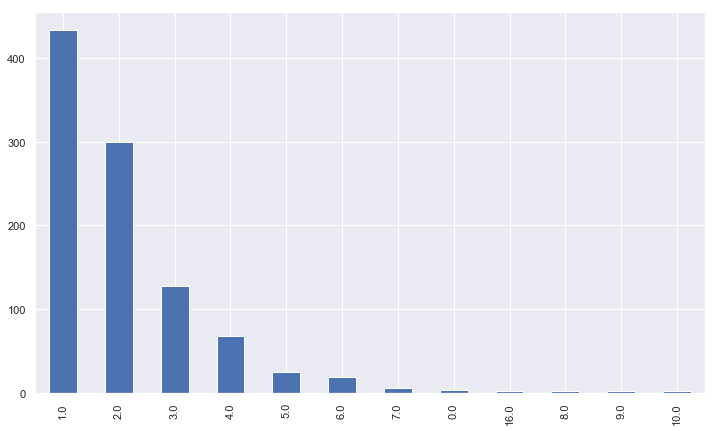

In [44]:
listings['beds'].value_counts().plot.bar()

> A potential anomaly appear when number of beds=16. Let's get into the details

In [45]:
listings.loc[listings['beds']==16]

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor
listing_id,,,,,,,,,,,,,,,
18691947,"[4, 40, 11, 44, 45, 46, 49, 50, 21, 89, 90, 91...",1.0,1.0,16.0,False,True,True,False,False,48.866076,2.382308,1,shared_room,0.9,1.0
18691419,"[49, 50, 4, 21, 40, 89, 90, 91, 44, 45, 46]",1.0,1.0,16.0,False,True,True,False,False,48.867191,2.381685,1,shared_room,0.9,1.0


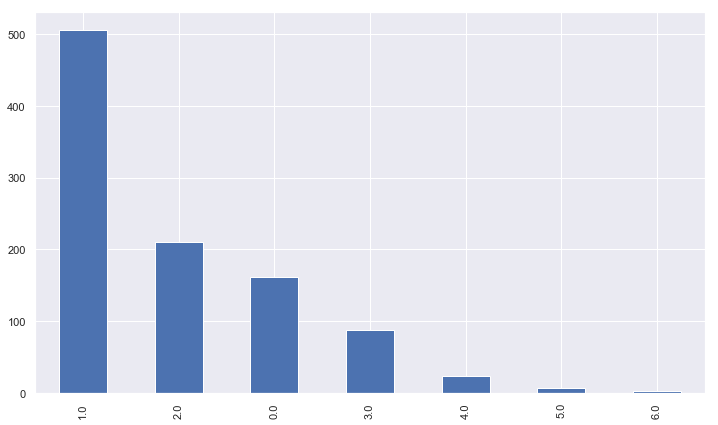

In [46]:
listings['bedrooms'].value_counts().plot.bar()

> A potential anomaly appear when number of bedrooms=0

In [47]:
listings.loc[listings['bedrooms']==0]['type'].value_counts()

entire_home     157
private_room      4
Name: type, dtype: int64

In [48]:
listings.loc[(listings['bedrooms']==0)&(listings['type']=='private_room')]

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor
listing_id,,,,,,,,,,,,,,,
3562428,"[32, 1, 3, 35, 4, 37, 39, 8, 10, 51, 55, 30, 31]",0.0,0.0,1.0,False,True,False,False,False,48.864651,2.363825,1,private_room,0.80,0.60
6521400,"[1, 33, 3, 35, 4, 8, 40, 41, 44, 45, 46, 47, 3...",1.0,0.0,2.0,False,True,False,False,False,48.868658,2.352798,3,private_room,0.99,0.98
21905043,"[16, 32, 35, 4, 5, 38, 39, 8, 30, 47]",1.0,0.0,1.0,False,True,False,False,False,48.860665,2.366999,10,private_room,1.00,1.00
25145168,"[1, 2, 4, 8, 77, 85, 86, 89, 90, 27, 91, 92, 9...",1.0,0.0,2.0,False,True,False,False,False,48.862173,2.358193,4,private_room,1.00,1.00


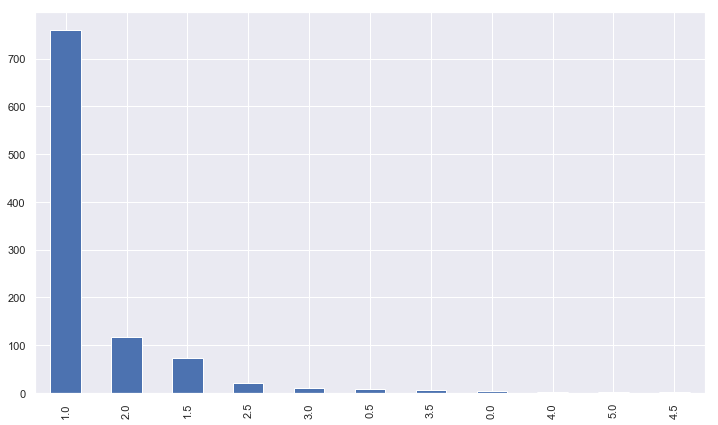

In [26]:
listings['bathrooms'].value_counts().plot.bar()

##### Interaction

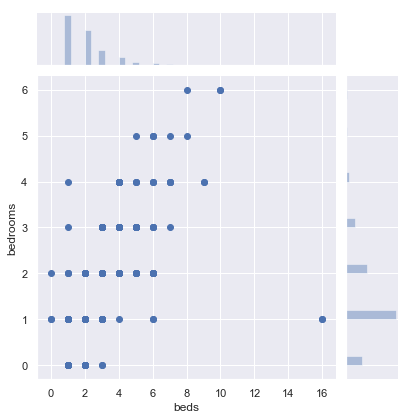

In [49]:
sns.jointplot(x='beds', y='bedrooms', data=listings)

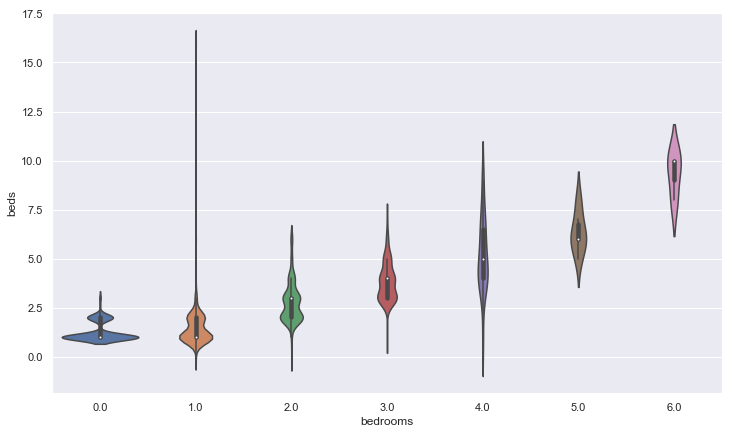

In [50]:
sns.violinplot(x='bedrooms', y='beds', data=listings)

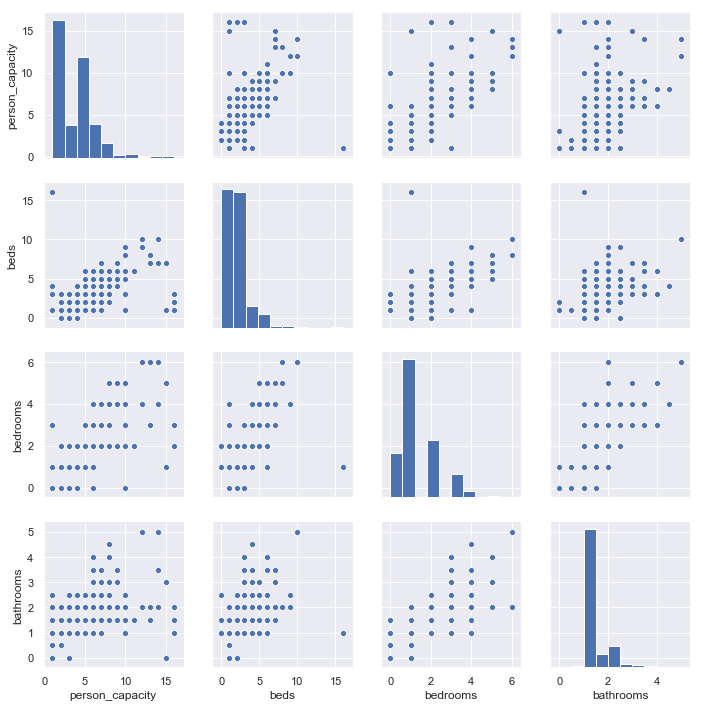

In [51]:
sns.pairplot(listings[["person_capacity", "beds", "bedrooms", "bathrooms"]])

##### Maps

We are interested in looking at the distribution of the apartments in Paris

Here we want to see if there is a correlation between the location and the number of person that the apartment can host. To do this we will use different colors:

- Black: 0
- Blue: 2,3
- Orange: 4,5,6
- Red: Other

In [30]:
m = Map(center=(48.86, 2.35), zoom=12, layers=(basemap_to_tiles(basemaps.CartoDB.Positron, "2017-04-08"),))

coords = listings[['person_capacity', 'latitude', 'longitude']]

def add_circle(row):
    circle = Circle()
    circle.location = (row['latitude'], row['longitude'])
    circle.radius = 1
    circle.color = "black"
    if 2 <= row['person_capacity'] <= 3:
        circle.color = "blue"
    if 4 <= row['person_capacity'] <= 6:
        circle.color = "orange"
    if row['person_capacity'] > 6:
        circle.color = "red"
    m.add_layer(circle)


coords.apply(add_circle, axis=1)
embed_minimal_html('map.html', views=[m], title='Carte des appartements')
m

Map(center=[48.86, 2.35], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_ou…

<div>
<img width=900 src='pics/airmap.png' /> 
</div>

<a id='s3_1_2'></a>
### DataViz II: amenities

We will study the __amenities__ in order to know which are the best to keep or discarding keeping in mind that even every amenities will add information on general ground, keeping redondant, highly correlated, or constant features will affect negatively the performance of the models. 

In [31]:
amenities.head()

,category,icon,is_business_ready_feature,is_present,is_safety_feature,name,select_list_view_photo,select_tile_view_photo,tag,tooltip
id,,,,,,,,,,
1,NaN,icon-tv,False,True,False,TV,NaN,NaN,tv,
2,NaN,icon-desktop,False,True,False,Cable TV,NaN,NaN,cable,
4,NaN,icon-wifi,False,True,False,Wifi,NaN,NaN,wireless_internet,Continuous access in the listing
5,NaN,icon-air-conditioning,False,False,False,Air conditioning,NaN,NaN,ac,
7,NaN,icon-pool,False,True,False,Pool,NaN,NaN,pool,Private or Shared


In [32]:
len(list(amenities['name']))

102

The purpose of the following codes are to isolate the amenities appearing more often and select among the entire set this last subset.

In [33]:
all_amenities = np.array([])

for amen in listings['amenity_ids']:
    all_amenities = np.hstack([all_amenities, amen])
    
all_amenities = all_amenities.astype(int)
unique, counts = np.unique(all_amenities, return_counts=True)

In [34]:
amenities_names = np.asarray([amenities.loc[x, 'name'] if x in amenities.index else '' for x in unique])
amenities_names[:10]

array(['TV', 'Cable TV', '', 'Wifi', 'Air conditioning', '', 'Pool',
       'Kitchen', 'Free parking on premises', 'Paid parking off premises'],
      dtype='<U32')

In [35]:
I_sort = np.argsort(counts)[::-1]
amenities_names[I_sort[:10]]

array(['Wifi', 'Heating', 'Essentials', 'Kitchen', 'Hair dryer',
       'Hangers', 'TV', 'Washer', 'Iron', 'Smoke detector'], dtype='<U32')

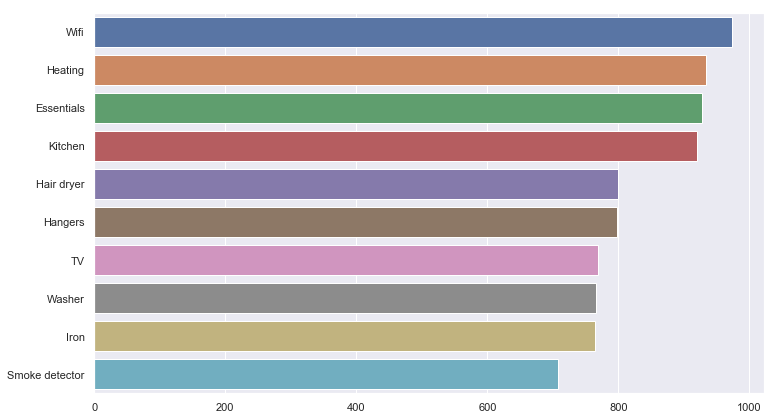

In [36]:
sns.barplot(x=counts[I_sort[:10]] , y=amenities_names[I_sort[:10]])

<a id='s3_1_3'></a>
### DataViz III: prices



In [52]:
prices = pd.read_csv("data/prices.csv").set_index('listing_id')

In [53]:
prices.iloc[:10, :]

,day,created,available,local_price,min_nights
listing_id,,,,,
5396,2018-08-27,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-28,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-29,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-30,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-31,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-09-01,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-09-02,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-09-03,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-09-04,2018-09-27 10:38:48.000+0000,False,103,2


In [54]:
uniques, counts = np.unique(prices.index, return_counts=True)  # We recover ID uniques and their recurrency
intersects = np.intersect1d(uniques, np.unique(listings.index))
print(counts) # How many prices for each apart
print(len(intersects))  # We check we got all the apart

[133 132 131 ... 132 133 133]
999


In [55]:
listings_prices = prices[prices.index.isin(intersects)]
listings_prices.iloc[:10, :]

,day,created,available,local_price,min_nights
listing_id,,,,,
56093,2018-08-27,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-28,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-29,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-30,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-31,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-09-01,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-09-02,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-09-03,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-09-04,2018-09-27 10:47:01.000+0000,False,170,4


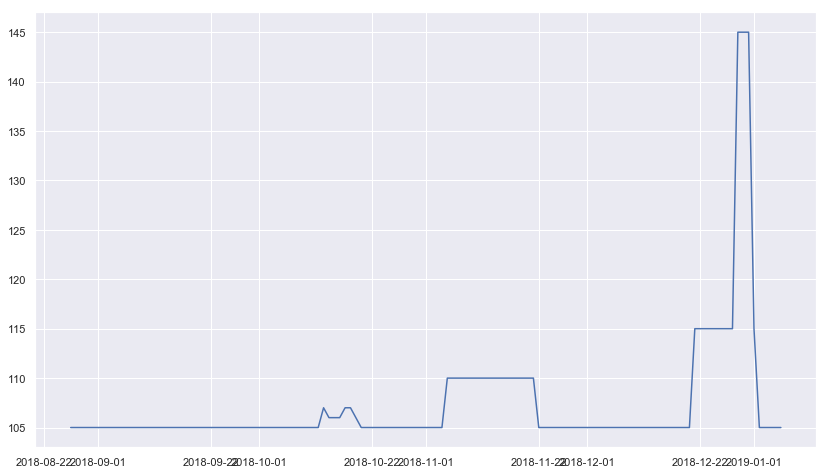

In [56]:
plt.figure(figsize=(14, 8))  # Affichage plus grand dans le notebook
ID = intersects[2]
series = listings_prices[listings_prices.index == ID]  # On récupère au bon ID
dates = np.asarray([ datetime.strptime(x, "%Y-%m-%d") for x in series["day"].values ])  # Les dates pour un bel affichage
I_sort = np.argsort(dates)
plt.plot(dates[I_sort], series["local_price"].values[I_sort])
plt.show()

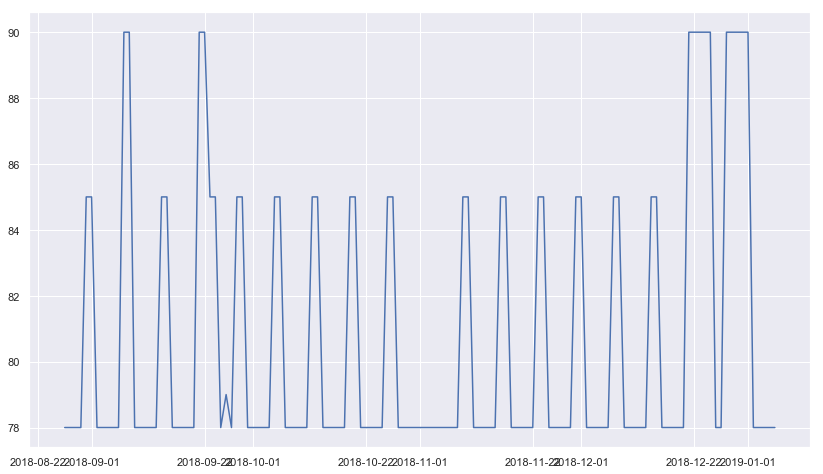

In [57]:
def plot_price(idx):
    plt.figure(figsize=(14, 8))  # Affichage plus grand dans le notebook
    series = listings_prices[listings_prices.index == idx]  # On récupère au bon ID
    dates = np.asarray([ datetime.strptime(x, "%Y-%m-%d") for x in series["day"].values ])  # Les dates pour un bel affichage
    I_sort = np.argsort(dates)
    plt.plot(dates[I_sort], series["local_price"].values[I_sort])
    plt.show()
    
plot_price(2581464)

<a id='ass2'></a>
### Assumptions II:


After the DataViz analysis, we decide to do do the following action on the dataset

- on __listings__ dataset we drop the rows with __beds__= 16 since they can be anomalies and the number of these apartment is relatively small (2 rows)  compared with the entire dataset. 

- on __listings__ dataset we keep rows with __bedrooms__ = 0 since as we checked by explicitly looking at the type of these apartments they mostly are 'entire_room' or 'private_room' (we are talking about studios for example) apartments that justify the number of bedrooms equal to zero. 

- on __listings__ dataset we saw, from map analysis that there is a cutoff on Paris that will restrict our models to work only within this zone. The algorithm will not be generalizable outside.

- on __amenitites__ dataset we keep only the first 10 amenities appearing more often.

<hr style="border: dashed rgb(0,1,0) 0.9px"/>

## <a class='anchor' id='s3_2'>Data Preparation</a>

In [84]:
prices = pd.read_csv("data/prices.csv", sep=",").set_index('listing_id')
listings = pd.read_csv("data/listings.csv").set_index('listing_id')
amenities = pd.read_json(path_or_buf="data/amenities.json")

In [85]:
listings.head()

,amenity_ids,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor
listing_id,,,,,,,,,,,,,,,
28581061,"[33, 4, 21, 8, 40]",2.0,1.0,1.0,False,True,False,True,False,48.869292,2.348335,1,private_room,1.00,1.00
661961,"[2, 3, 131, 4, 8, 40, 104, 41, 43, 12, 45, 77,...",1.0,1.0,1.0,False,True,True,False,False,48.867284,2.403255,2,entire_home,0.88,0.69
1261705,"[33, 34, 35, 4, 8, 40, 45, 30, 46]",1.0,1.0,1.0,False,True,True,False,False,48.867894,2.375897,1,private_room,1.00,1.00
1318834,"[1, 33, 2, 3, 4, 8, 30, 31]",1.0,2.0,2.0,False,True,False,False,False,48.870370,2.358510,3,entire_home,0.82,0.48
1677091,"[33, 129, 35, 4, 103, 8, 40, 10, 11, 77, 46, 4...",1.0,1.0,1.0,False,True,True,False,False,48.874149,2.373700,2,entire_home,0.95,0.90


### Amenities Selection

In [86]:
import ast
# Keep only the amenities we want
keep_amenities_name = ['TV', 'Cable TV', 'Wifi', 'Kitchen', 'Breakfast', 'Essentials']
keep_amenities_id = amenities[amenities['name'].isin(keep_amenities_name)].index.values

def create_amenities(row):
    for i, name in enumerate(keep_amenities_name):
        row[name] = 0
        current_amenities_id = ast.literal_eval(row['amenity_ids'])
        if keep_amenities_id[i] in current_amenities_id:
            row[name] = 1
    return row

listings = listings.apply(create_amenities, axis=1)
listings = listings.drop('amenity_ids', axis=1)
listings.head()

,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor,TV,Cable TV,Wifi,Kitchen,Breakfast,Essentials
listing_id,,,,,,,,,,,,,,,,,,,,
28581061,2.0,1.0,1.0,False,True,False,True,False,48.869292,2.348335,1,private_room,1.00,1.00,0,0,0,0,0,1
661961,1.0,1.0,1.0,False,True,True,False,False,48.867284,2.403255,2,entire_home,0.88,0.69,0,0,1,0,0,0
1261705,1.0,1.0,1.0,False,True,True,False,False,48.867894,2.375897,1,private_room,1.00,1.00,0,0,0,0,0,0
1318834,1.0,2.0,2.0,False,True,False,False,False,48.870370,2.358510,3,entire_home,0.82,0.48,0,1,1,0,0,0
1677091,1.0,1.0,1.0,False,True,True,False,False,48.874149,2.373700,2,entire_home,0.95,0.90,0,0,0,0,0,0


### Price Selection

This step is delicate, because it depends on how you want to represent the prices. There are two choices that we will study here:

- We aggregate the prices per week (or per pack of x days) and we duplicate an apartment as many times as there are weeks: only the time variable and the price will change.


- We extract temporal information (weekday, weekend, vacation, etc.) to only detect particular days by averaging the price for each possible modality.


#### Regroupement par plages de dates

In [87]:
prices.head()

,day,created,available,local_price,min_nights
listing_id,,,,,
5396,2018-08-27,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-28,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-29,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-30,2018-09-27 10:38:48.000+0000,False,103,2
5396,2018-08-31,2018-09-27 10:38:48.000+0000,False,103,2


In [88]:
uniques, counts = np.unique(prices.index, return_counts=True) 
intersects = np.intersect1d(uniques, np.unique(listings.index))
listings_prices = prices[prices.index.isin(intersects)]
listings_prices.head()

,day,created,available,local_price,min_nights
listing_id,,,,,
56093,2018-08-27,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-28,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-29,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-30,2018-09-27 10:47:01.000+0000,False,170,4
56093,2018-08-31,2018-09-27 10:47:01.000+0000,False,170,4


The weekly grouping is carried out in several stages:

- First of all, we get the most up-to-date price for each apartment and each date

- Then, we group each apartment and each date by averaging the price

- We add, for each week, a line associated with the right price in the initial dataset

##### First Step

In [89]:
listings_prices['created'] = pd.to_datetime(listings_prices['created'])
listings_prices['created']

listing_id
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47:01+00:00
56093      2018-09-27 10:47

In [90]:
listings_prices.sort_values(['listing_id', 'day', 'created'])

,day,created,available,local_price,min_nights
listing_id,,,,,
56093,2018-08-27,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-08-28,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-08-29,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-08-30,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-08-31,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-09-01,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-09-02,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-09-03,2018-09-27 10:47:01+00:00,False,170,4
56093,2018-09-04,2018-09-27 10:47:01+00:00,False,170,4


In [91]:
sorted_listings_prices = listings_prices.sort_values(['listing_id', 'day', 'created'])
sorted_listings_prices.groupby(by=['listing_id', 'day']).last()

created  available  local_price  \
listing_id day                                                            
56093      2018-08-27 2018-09-27 10:47:01+00:00      False          170   
           2018-08-28 2018-09-27 10:47:01+00:00      False          170   
           2018-08-29 2018-09-27 10:47:01+00:00      False          170   
           2018-08-30 2018-09-27 10:47:01+00:00      False          170   
           2018-08-31 2018-09-27 10:47:01+00:00      False          170   
           2018-09-01 2018-09-27 10:47:01+00:00      False          170   
           2018-09-02 2018-09-27 10:47:01+00:00      False          170   
           2018-09-03 2018-09-27 10:47:01+00:00      False          170   
           2018-09-04 2018-09-27 10:47:01+00:00      False          170   
           2018-09-05 2018-09-27 10:47:01+00:00      False          170   
           2018-09-06 2018-09-27 10:47:01+00:00      False          170   
           2018-09-07 2018-09-27 10:47:01+00:00      False          170   
           2018-09-08 2018-09-27 10:47:01+00:00      False          170   
           2018-09-09 2018-09-27 10:47:01+00:00      False          170   
           2018-09-10 2018-09-27 10:47:01+00:00      False          170   
           2018-09-11 2018-09-27 10:47:01+00:00      False          170   
           2018-09-12 2018-09-27 10:47:01+00:00      False          170   
           2018-09-13 2018-09-27 10:47:01+00:00      False          170   
           2018-09-14 2018-09-27 10:47:01+00:00      False          170   
           2018-09-15 2018-09-27 10:47:01+00:00      False          170   
           2018-09-16 2018-09-27 10:47:01+00:00      False          170   
           2018-09-17 2018-09-27 10:47:01+00:00      False          170   
           2018-09-18 2018-09-27 10:47:01+00:00      False          170   
           2018-09-19 2018-09-27 10:47:01+00:00      False          170   
           2018-09-20 2018-09-27 10:47:01+00:00      False          170   
           2018-09-21 2018-09-27 10:47:01+00:00      False          170   
           2018-09-22 2018-09-27 10:47:01+00:00      False          170   
           2018-09-23 2018-09-27 10:47:01+00:00      False          170   
           2018-09-24 2018-09-27 10:47:01+00:00      False          170   
           2018-09-25 2018-09-27 10:47:01+00:00      False          170   
...                                         ...        ...          ...   
28792796   2018-12-08 2018-09-27 10:54:20+00:00       True           49   
           2018-12-09 2018-09-27 10:54:20+00:00       True           49   
           2018-12-10 2018-09-27 10:54:20+00:00       True           49   
           2018-12-11 2018-09-27 10:54:20+00:00       True           49   
           2018-12-12 2018-09-27 10:54:20+00:00       True           49   
           2018-12-13 2018-09-27 10:54:20+00:00       True           49   
           2018-12-14 2018-09-27 10:54:20+00:00       True           49   
           2018-12-15 2018-09-27 10:54:20+00:00       True           49   
           2018-12-16 2018-09-27 10:54:20+00:00       True           49   
           2018-12-17 2018-09-27 10:54:20+00:00       True           49   
           2018-12-18 2018-09-27 10:54:20+00:00       True           49   
           2018-12-19 2018-09-27 10:54:20+00:00       True           49   
           2018-12-20 2018-09-27 10:54:20+00:00       True           49   
           2018-12-21 2018-09-27 10:54:20+00:00       True           49   
           2018-12-22 2018-09-27 10:54:20+00:00       True           49   
           2018-12-23 2018-09-27 10:54:20+00:00       True           49   
           2018-12-24 2018-09-27 10:54:20+00:00       True           49   
           2018-12-25 2018-09-27 10:54:20+00:00       True           49   
           2018-12-26 2018-09-27 10:54:20+00:00       True           49   
           2018-12-27 2018-09-27 10:54:20+00:00       True           50   
           2018-12-28 2018-09-27 10:54:20+00:00       True       

In [92]:
unique_listings_prices = sorted_listings_prices.groupby(by=['listing_id', 'day']).last().reset_index()

##### Second Step

In [93]:
dates = pd.to_datetime(unique_listings_prices["day"], format='%Y-%m-%d')
agg_prices = unique_listings_prices.assign(date=dates).groupby(['listing_id', pd.Grouper(key='date', freq='7D')]).mean()
agg_prices.head()

available  local_price  min_nights
listing_id date                                          
56093      2018-08-27        0.0        170.0         4.0
           2018-09-03        0.0        170.0         4.0
           2018-09-10        0.0        170.0         4.0
           2018-09-17        0.0        170.0         4.0
           2018-09-24        0.0        170.0         4.0

In [94]:
agg_prices = agg_prices.reset_index()
agg_prices['week_number'] = agg_prices['date'].dt.week
agg_prices = agg_prices.set_index('listing_id')
agg_prices.head()

,date,available,local_price,min_nights,week_number
listing_id,,,,,
56093,2018-08-27,0.0,170.0,4.0,35
56093,2018-09-03,0.0,170.0,4.0,36
56093,2018-09-10,0.0,170.0,4.0,37
56093,2018-09-17,0.0,170.0,4.0,38
56093,2018-09-24,0.0,170.0,4.0,39


In [95]:
listings.head()

,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,person_capacity,type,weekly_factor,monthly_factor,TV,Cable TV,Wifi,Kitchen,Breakfast,Essentials
listing_id,,,,,,,,,,,,,,,,,,,,
28581061,2.0,1.0,1.0,False,True,False,True,False,48.869292,2.348335,1,private_room,1.00,1.00,0,0,0,0,0,1
661961,1.0,1.0,1.0,False,True,True,False,False,48.867284,2.403255,2,entire_home,0.88,0.69,0,0,1,0,0,0
1261705,1.0,1.0,1.0,False,True,True,False,False,48.867894,2.375897,1,private_room,1.00,1.00,0,0,0,0,0,0
1318834,1.0,2.0,2.0,False,True,False,False,False,48.870370,2.358510,3,entire_home,0.82,0.48,0,1,1,0,0,0
1677091,1.0,1.0,1.0,False,True,True,False,False,48.874149,2.373700,2,entire_home,0.95,0.90,0,0,0,0,0,0


##### Third Step

In [96]:
listings_prices = listings.join(agg_prices[['local_price', 'week_number']], how="right")
listings_prices.head()

,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,longitude,...,weekly_factor,monthly_factor,TV,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number
listing_id,,,,,,,,,,,,,,,,,,,,,
56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,2.358431,...,0.88,1.0,0,0,1,0,0,1,170.0,35
56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,2.358431,...,0.88,1.0,0,0,1,0,0,1,170.0,36
56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,2.358431,...,0.88,1.0,0,0,1,0,0,1,170.0,37
56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,2.358431,...,0.88,1.0,0,0,1,0,0,1,170.0,38
56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,2.358431,...,0.88,1.0,0,0,1,0,0,1,170.0,39


In [112]:
listings_prices.to_csv("data/listings_prices.csv", index=True)

### Encoding

In [113]:
dataset = pd.read_csv("data/listings_prices.csv")
dataset.head()

,listing_id,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,...,weekly_factor,monthly_factor,TV,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number
0,56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,35
1,56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,36
2,56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,37
3,56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,38
4,56093,1.0,1.0,2.0,False,True,True,False,False,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,39


In [114]:
dataset.columns

Index(['listing_id', 'bathrooms', 'bedrooms', 'beds',
       'is_business_travel_ready', 'is_fully_refundable',
       'is_host_highly_rated', 'is_new_listing', 'is_rebookable', 'latitude',
       'longitude', 'person_capacity', 'type', 'weekly_factor',
       'monthly_factor', 'TV', 'Cable TV', 'Wifi', 'Kitchen', 'Breakfast',
       'Essentials', 'local_price', 'week_number'],
      dtype='object')

In [115]:
dataset['is_business_travel_ready'] = 1 * dataset['is_business_travel_ready']

In [116]:
dataset['is_fully_refundable'] = 1 * dataset['is_fully_refundable']
dataset['is_host_highly_rated'] = 1 * dataset['is_host_highly_rated']
dataset['is_new_listing'] = 1 * dataset['is_new_listing']
dataset['is_rebookable'] = 1 * dataset['is_rebookable']

In [117]:
dataset.head()

,listing_id,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,...,weekly_factor,monthly_factor,TV,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number
0,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,35
1,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,36
2,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,37
3,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,38
4,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0.88,1.0,0,0,1,0,0,1,170.0,39


In [118]:
pd.get_dummies(dataset['type'])

,entire_home,private_room,shared_room
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
5,1,0,0
6,1,0,0
7,1,0,0
8,1,0,0
9,1,0,0


In [119]:
dataset.join(pd.get_dummies(dataset['type']))

,listing_id,bathrooms,bedrooms,beds,is_business_travel_ready,is_fully_refundable,is_host_highly_rated,is_new_listing,is_rebookable,latitude,...,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number,entire_home,private_room,shared_room
0,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,35,1,0,0
1,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,36,1,0,0
2,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,37,1,0,0
3,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,38,1,0,0
4,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,39,1,0,0
5,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,40,1,0,0
6,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,41,1,0,0
7,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,42,1,0,0
8,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,43,1,0,0
9,56093,1.0,1.0,2.0,0,1,1,0,0,48.867284,...,0,1,0,0,1,170.000000,44,1,0,0


### Missing Values

In [120]:
dataset.isna().any()

listing_id                  False
bathrooms                   False
bedrooms                     True
beds                         True
is_business_travel_ready    False
is_fully_refundable         False
is_host_highly_rated        False
is_new_listing              False
is_rebookable               False
latitude                    False
longitude                   False
person_capacity             False
type                        False
weekly_factor               False
monthly_factor              False
TV                          False
Cable TV                    False
Wifi                        False
Kitchen                     False
Breakfast                   False
Essentials                  False
local_price                 False
week_number                 False
dtype: bool

In [121]:
dataset.loc[dataset['bedrooms'].isna(), 'listing_id'].value_counts()

1758586     19
7892333     19
28173671    19
1139385     19
28267576    19
Name: listing_id, dtype: int64

In [122]:
dataset.loc[dataset['bedrooms'].isna(), 'bedrooms'] = 1

In [123]:
dataset.loc[dataset['beds'].isna(), 'listing_id'].value_counts()

25790947    19
26115764    19
24841125    19
28684174    19
25986935    19
26626163    19
25497375    19
27822870    19
25497365    19
26760709    19
Name: listing_id, dtype: int64

In [124]:
dataset.loc[dataset['beds'].isna(), 'bedrooms'].value_counts()

1.0    190
Name: bedrooms, dtype: int64

In [125]:
dataset.loc[dataset['beds'].isna(), 'person_capacity'].value_counts()

2    76
4    57
3    38
5    19
Name: person_capacity, dtype: int64

In [126]:
dataset.loc[dataset['beds'].isna(), 'beds'] = (dataset.loc[dataset['beds'].isna(), 'person_capacity'] + 1) // 2

In [127]:
dataset.isna().any()

listing_id                  False
bathrooms                   False
bedrooms                    False
beds                        False
is_business_travel_ready    False
is_fully_refundable         False
is_host_highly_rated        False
is_new_listing              False
is_rebookable               False
latitude                    False
longitude                   False
person_capacity             False
type                        False
weekly_factor               False
monthly_factor              False
TV                          False
Cable TV                    False
Wifi                        False
Kitchen                     False
Breakfast                   False
Essentials                  False
local_price                 False
week_number                 False
dtype: bool

In [128]:
dataset['is_business_travel_ready'].value_counts()

0    18981
Name: is_business_travel_ready, dtype: int64

In [129]:
dataset['is_rebookable'].value_counts()

0    18981
Name: is_rebookable, dtype: int64

In [130]:
dataset = dataset.drop(['is_business_travel_ready', 'is_rebookable'], axis=1)

In [131]:
final_dataset = dataset.join(pd.get_dummies(dataset['type']))
del final_dataset['type']
final_dataset.shape

(18981, 23)

In [133]:
final_dataset.head()

,listing_id,bathrooms,bedrooms,beds,is_fully_refundable,is_host_highly_rated,is_new_listing,latitude,longitude,person_capacity,...,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number,entire_home,private_room,shared_room
0,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,35,1,0,0
1,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,36,1,0,0
2,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,37,1,0,0
3,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,38,1,0,0
4,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,39,1,0,0


In [135]:
final_dataset.to_csv("data/dataset.csv", index=False)

<hr style="border: dashed rgb(0,0,0) 1px"/>

# <a class='anchor' id='s4'>Modelling Data</a>

In [6]:
dataset = pd.read_csv("data/dataset.csv")
dataset.sample(n=5)

,listing_id,bathrooms,bedrooms,beds,is_fully_refundable,is_host_highly_rated,is_new_listing,latitude,longitude,person_capacity,...,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number,entire_home,private_room,shared_room
6565,11568981,2.0,2.0,3.0,1,1,0,48.858188,2.353065,6,...,1,0,1,0,1,198.571429,45,1,0,0
4332,5452049,1.0,1.0,1.0,1,1,0,48.852433,2.341348,2,...,1,1,1,0,1,175.714286,35,1,0,0
15304,25053601,1.0,1.0,1.0,1,0,0,48.875536,2.380604,2,...,0,0,0,0,0,41.000000,44,1,0,0
10756,19224902,1.0,2.0,2.0,1,1,0,48.855974,2.308832,3,...,1,1,0,0,0,230.000000,37,1,0,0
9676,17432320,2.0,3.0,3.0,1,1,0,48.875023,2.344265,6,...,1,1,0,0,1,353.000000,40,1,0,0


## <a class='anchor' id='s4_1'>Linear Model</a>

In [137]:
X = dataset.drop(['local_price', 'listing_id'], axis=1)
y = dataset['local_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.8, random_state=42)

In [139]:
regr = LinearRegression()

regr.fit(X_train.values, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [140]:
print("Score train : {:2.1f}%".format(r2_score(y_train, regr.predict(X_train)) * 100))
print("Score test : {:2.1f}%".format(r2_score(y_test, regr.predict(X_test)) * 100))

Score train : 45.1%
Score test : 44.4%


In [141]:
residuals = y_train - regr.predict(X_train)
residuals.describe()

count    1.518400e+04
mean    -5.430692e-13
std      1.396559e+02
min     -3.638225e+02
25%     -6.668640e+01
50%     -1.771857e+01
75%      2.789365e+01
max      2.234034e+03
Name: local_price, dtype: float64

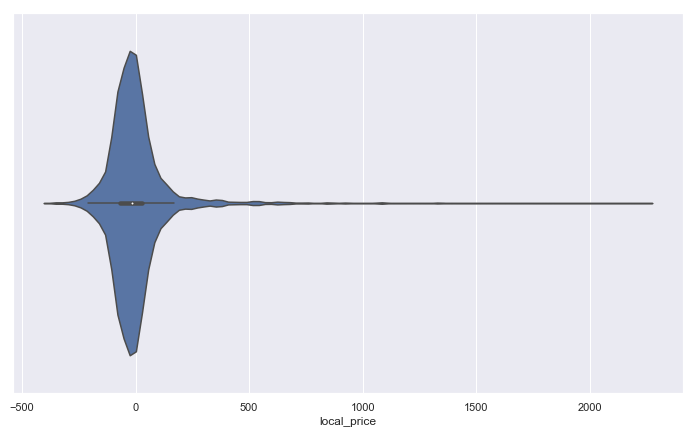

In [142]:
sns.violinplot(residuals)

## <a class='anchor' id='s4_2'>Decision Tree Model</a>

In [144]:
X = dataset.drop(['local_price', 'listing_id'], axis=1)
y = dataset['local_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [145]:
regr = DecisionTreeRegressor(max_depth=8)
regr.fit(X_train, y_train)

DecisionTreeRegressor(criterion='mse', max_depth=8, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [149]:
print("Score train : {:2.1f}%".format(r2_score(y_train, regr.predict(X_train)) * 100))
print("Score test : {:2.1f}%".format(r2_score(y_test, regr.predict(X_test)) * 100))

Score train : 73.6%
Score test : 74.3%


In [150]:
from sklearn.tree import DecisionTreeRegressor
regr = DecisionTreeRegressor(max_depth=20)
regr.fit(X_train, y_train)

print("Score train : {:2.1f}%".format(r2_score(y_train, regr.predict(X_train)) * 100))
print("Score test : {:2.1f}%".format(r2_score(y_test, regr.predict(X_test)) * 100))

Score train : 99.4%
Score test : 94.8%


In [152]:
features_imp = pd.DataFrame(
    data=np.asarray([X.columns, regr.feature_importances_]).transpose(),
    columns=['Variable', 'Importance'])

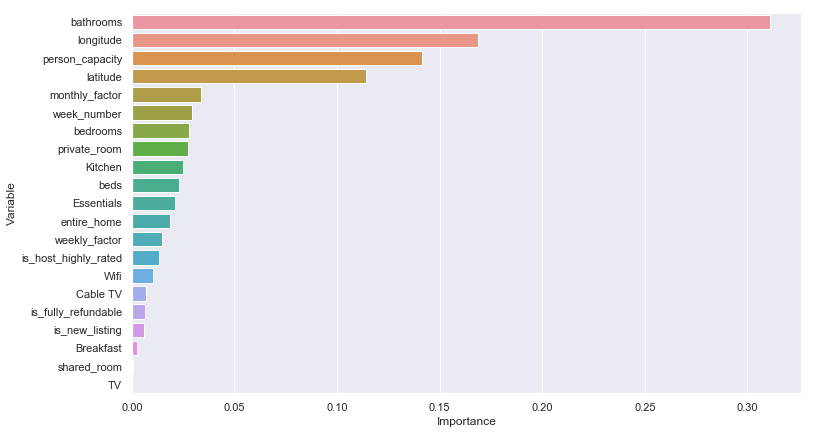

In [153]:
sns.barplot(y='Variable', x='Importance', data=features_imp.sort_values(by='Importance', ascending=False))

In [159]:
dot_data = tree.export_graphviz(regr, out_file=None) 
graph = graphviz.Source(dot_data)
graph.render("tree",view=True)

'tree.pdf'

In [162]:
from IPython.display import display
display(graphviz.Source(tree.export_graphviz(regr)))

## <a class='anchor' id='s4_3'>Random Forest Model</a>

In [4]:
X = dataset.drop(['local_price'], axis=1)
y = dataset['local_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=23)

In [5]:
rf = RandomForestRegressor(max_depth=6,
                           n_estimators=100,
                           min_samples_leaf=10,
                           max_features=8)
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=6,
           max_features=8, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=10,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=None, oob_score=False,
           random_state=None, verbose=0, warm_start=False)

In [6]:
print("Score train : {:2.1f}%".format(r2_score(y_train, rf.predict(X_train)) * 100))
print("Score test : {:2.1f}%".format(r2_score(y_test, rf.predict(X_test)) * 100))

Score train : 68.7%
Score test : 63.1%


In [7]:
grid_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7]
}

cv_result = {
    'mean_test_score': [],
    'parameters': []
}

for params in product(*grid_params.values()):
    
    rf = RandomForestRegressor(max_depth=params[0],
                               n_estimators=params[1],
                               min_samples_leaf=10,
                               max_features=8)
    rf.fit(X_train, y_train)
    test_score = r2_score(y_test, rf.predict(X_test))
    
    cv_result['mean_test_score'].append(test_score)
    cv_result['parameters'].append(params)

In [8]:
def plot_grid_results(cv):
    score_matrix = np.asarray(cv["mean_test_score"]).reshape((3,3))

    plt.figure(figsize=(10, 7))
    plt.title("Scores R2")
    sns.set(font_scale=1.5)
    annotations = np.array([[str("{:2.0f}%".format(x * 100))
                              for x in row ] for row in score_matrix])
    ax = sns.heatmap(score_matrix, annot=annotations, fmt="",
               yticklabels=grid_params["n_estimators"],
               xticklabels=grid_params["max_depth"])
    ax.set(ylabel="Number of trees", xlabel="max_depth")

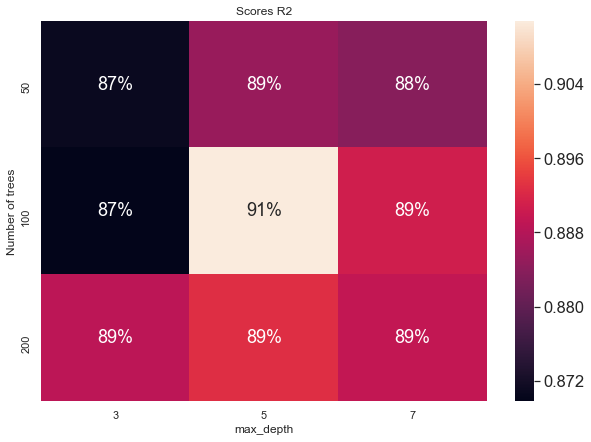

In [9]:
plot_grid_results(cv_result)

In [10]:
grid_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [6, 8, 10],
    'min_samples_leaf': [1, 5, 20]
}

cv_result = {
    'mean_test_score': [],
    'parameters': []
}

for params in product(*grid_params.values()):
    kfold = KFold(n_splits=10, shuffle=True)

    outputs = []
    for train_I, test_I in kfold.split(X):
        X_fold_train = X.iloc[train_I, :]
        y_fold_train = y.values[train_I]
        X_fold_test = X.iloc[test_I, :]
        y_fold_test = y.values[test_I]

        rf = RandomForestRegressor(n_estimators=params[0],
                                   max_depth=params[1],
                                   min_samples_leaf=params[2])
        rf.fit(X_fold_train, y_fold_train)

        outputs.append(r2_score(y_fold_test, rf.predict(X_fold_test)))
    
    cv_result['mean_test_score'].append(np.mean(outputs))
    cv_result['parameters'].append(params)
    print("hyper-parametres :", params, "- Score mean : {:2.1f}%".format(np.mean(outputs) * 100))

hyper-parametres : (50, 6, 1) - Score mean : 67.2%
hyper-parametres : (50, 6, 5) - Score mean : 67.5%
hyper-parametres : (50, 6, 20) - Score mean : 64.0%
hyper-parametres : (50, 8, 1) - Score mean : 79.8%
hyper-parametres : (50, 8, 5) - Score mean : 79.6%
hyper-parametres : (50, 8, 20) - Score mean : 76.9%
hyper-parametres : (50, 10, 1) - Score mean : 89.6%
hyper-parametres : (50, 10, 5) - Score mean : 89.0%
hyper-parametres : (50, 10, 20) - Score mean : 82.0%
hyper-parametres : (100, 6, 1) - Score mean : 67.3%
hyper-parametres : (100, 6, 5) - Score mean : 66.9%
hyper-parametres : (100, 6, 20) - Score mean : 64.3%
hyper-parametres : (100, 8, 1) - Score mean : 79.6%
hyper-parametres : (100, 8, 5) - Score mean : 79.5%
hyper-parametres : (100, 8, 20) - Score mean : 76.3%
hyper-parametres : (100, 10, 1) - Score mean : 89.6%
hyper-parametres : (100, 10, 5) - Score mean : 88.7%
hyper-parametres : (100, 10, 20) - Score mean : 82.0%
hyper-parametres : (200, 6, 1) - Score mean : 67.5%
hyper-par

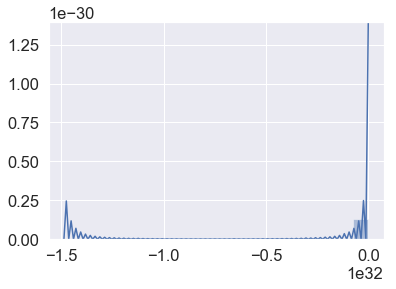

In [21]:
X['group'] = X.groupby(['longitude', 'latitude', 'bathrooms', 'bedrooms']).ngroup()

logocv = LeaveOneGroupOut()

outputs = []
for train_I, test_I in logocv.split(X, y, X['group']):
    X_fold_train = X.iloc[train_I, :]
    y_fold_train = y.values[train_I]
    X_fold_test = X.iloc[test_I, :]
    y_fold_test = y.values[test_I]
    
    rf = RandomForestRegressor(n_estimators=50, max_depth=3, min_samples_leaf=10)
    rf.fit(X_fold_train, y_fold_train)
    
    outputs.append(r2_score(y_fold_test, rf.predict(X_fold_test)))
    
sns.distplot(outputs, bins=20)

## <a class='anchor' id='s4_4'>Gradient Boosting Model</a>

In [33]:
X = dataset.drop(['local_price'], axis=1)
y = dataset['local_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=23)

In [34]:
params = {
    'max_depth': 3,
    'learning_rate': 0.1,
    'n_rounds': 200,
    'silent': True
}

model = xgb.XGBRegressor(**params)
model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, n_rounds=200, nthread=None, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=1, verbosity=1)

In [35]:
print("Score train : {:2.1f}%".format(r2_score(y_train, model.predict(X_train)) * 100))
print("Score test : {:2.1f}%".format(r2_score(y_test, model.predict(X_test)) * 100))

Score train : 76.6%
Score test : 70.8%


## <a class='anchor' id='s5'>Model Selection and Assessment</a>

### <a class='anchor' id='s5_1'>Best Model Selection</a>

In [43]:
kf= KFold(n_splits=3, shuffle=True)

grid_params = {
    'n_estimators': np.arange(50,400,20),
    'max_depth': np.arange(3,12,2),
    'learning_rate': [0.1, 0.01, 0.001]
}

model = xgb.XGBRegressor(random_state=42)
clf = GridSearchCV(model, param_grid=grid_params, n_jobs=-1, cv=kf, refit='MSE')

clf.fit(dataset.drop(['local_price','listing_id'],axis=1), dataset.local_price)

[18:11:36] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


GridSearchCV(cv=KFold(n_splits=3, random_state=None, shuffle=True),
       error_score='raise-deprecating',
       estimator=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': array([ 50,  70,  90, 110, 130, 150, 170, 190, 210, 230, 250, 270, 290,
       310, 330, 350, 370, 390]), 'max_depth': array([ 3,  5,  7,  9, 11]), 'learning_rate': [0.1, 0.01, 0.001]},
       pre_dispatch='2*n_jobs', refit='MSE', return_train_score='warn',
       scoring=None, verbose=0)

In [46]:
clf.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=11, min_child_weight=1, missing=None, n_estimators=390,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

In [47]:
clf.best_params_

{'learning_rate': 0.1, 'max_depth': 11, 'n_estimators': 390}

In [48]:
clf.best_score_

0.9731111335732854

In [55]:
kf= KFold(n_splits=3, shuffle=True)

grid_params = {
    'max_depth': randint(2,15),
    'n_estimators': randint(50,400),
}
reg = xgb.XGBRegressor(objective='reg:squarederror',learning_rate=0.1)
clf = RandomizedSearchCV(reg, param_distributions=grid_params, n_iter=50, cv=kf, refit=True, random_state=42)

clf.fit(dataset.drop(['local_price','listing_id'],axis=1), dataset.local_price)

RandomizedSearchCV(cv=KFold(n_splits=3, random_state=None, shuffle=True),
          error_score='raise-deprecating',
          estimator=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:squarederror',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=1, verbosity=1),
          fit_params=None, iid='warn', n_iter=50, n_jobs=None,
          param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1c22654128>, 'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1c224a96d8>},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [56]:
clf.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=10, min_child_weight=1, missing=None, n_estimators=376,
       n_jobs=1, nthread=None, objective='reg:squarederror',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=1, verbosity=1)

In [57]:
clf.best_params_

{'max_depth': 10, 'n_estimators': 376}

In [58]:
clf.best_score_

0.9681301367388022

### <a class='anchor' id='s5_2'>Best Model Evaluation</a>

In [7]:
dataset.head()

,listing_id,bathrooms,bedrooms,beds,is_fully_refundable,is_host_highly_rated,is_new_listing,latitude,longitude,person_capacity,...,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number,entire_home,private_room,shared_room
0,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,35,1,0,0
1,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,36,1,0,0
2,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,37,1,0,0
3,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,38,1,0,0
4,56093,1.0,1.0,2.0,1,1,0,48.867284,2.358431,4,...,0,1,0,0,1,170.0,39,1,0,0


In [3]:
best_estimator_=xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=10, min_child_weight=1, missing=None, n_estimators=376,
       n_jobs=1, nthread=None, objective='reg:squarederror',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=1, verbosity=1)

In [15]:
def r2(rep):
    rkf= RepeatedKFold(n_splits=3, n_repeats=rep, random_state=None)
    r2=[]
    for train_I, test_I in rkf.split(dataset):
        X_fold_train = dataset.iloc[train_I, :].drop(['local_price','listing_id'],axis=1)
        y_fold_train = dataset['local_price'].values[train_I]
        X_fold_test = dataset.iloc[test_I, :].drop(['local_price','listing_id'],axis=1)
        y_fold_test = dataset['local_price'].values[test_I]
        reg = best_estimator_
        reg.fit(X_fold_train, y_fold_train)
        r2.append(r2_score(y_fold_test, reg.predict(X_fold_test)))
    
    print('The estimation of the r2 score over the test distributions is:', "{:2.2f}%".format(np.mean(r2)*100),'\u00B1', "{:2.2f}%".format(np.std(r2)*100))
    print("The confidence interval is [{:2.1f}%, {:2.1f}%]".format(*np.quantile(r2, q=[0.025, 0.975]) * 100))
    
    return r2

The estimation of the r2 score over the test distributions is: 97.12% ± 0.46%
The confidence interval is [96.2%, 97.8%]


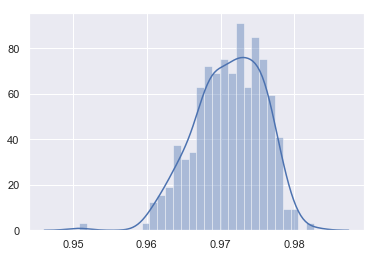

In [16]:
sns.distplot(r2(100),bins=30)

In [17]:
X = dataset.drop(['local_price', 'listing_id'], axis=1)
y = dataset['local_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [67]:
n_est=[5,300]
models = []
for it in n_est:
    boost=xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=11, min_child_weight=1, missing=None, n_estimators=it,
       n_jobs=1, nthread=None, random_state=42,objective='reg:squarederror',
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)
    boost.fit(X_train, y_train)
    models.append(boost)

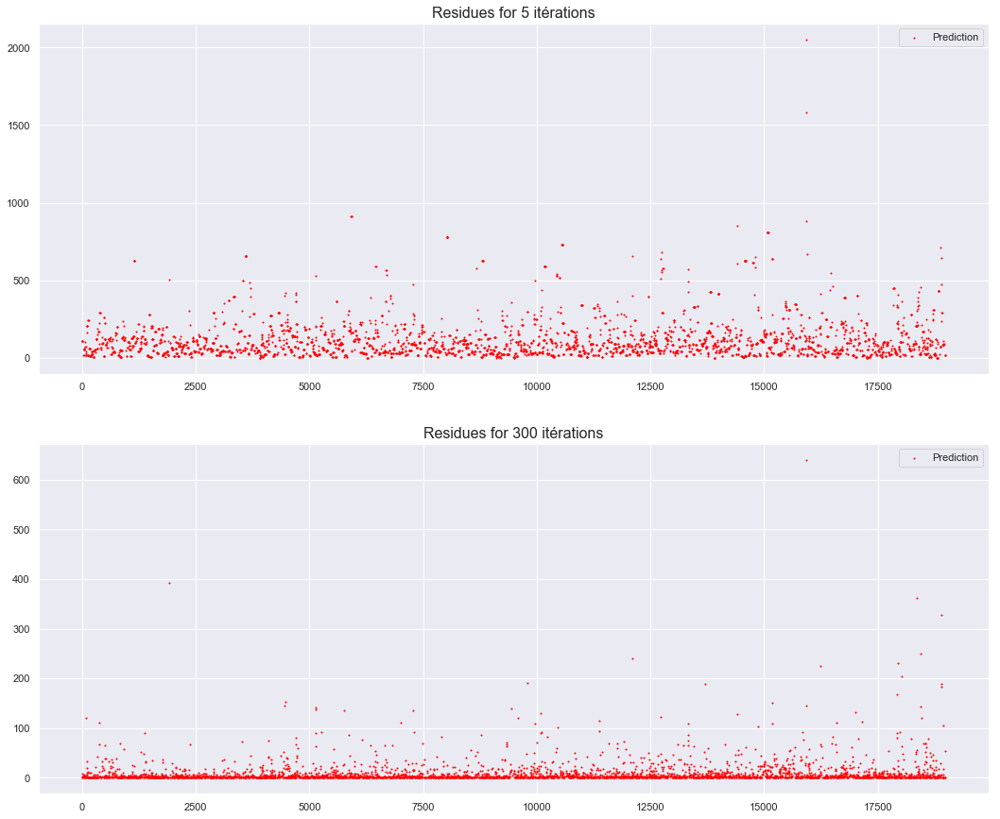

In [82]:
fig, axes = plt.subplots(2, figsize=(18,15))
for i in range(2):
    axes[i].scatter(X_test.index, np.abs(models[i].predict(X_test) - y_test), color="red", alpha=1, label="Prediction",marker='o',s=1)
    axes[i].set_title("Residues for {0} itérations".format(n_est[i]), fontsize=16)
    axes[i].legend()
plt.show()

In [73]:
np.mean(models[1].predict(X_test) - y_test)

-0.08563264898733178

In [74]:
np.std(models[1].predict(X_test) - y_test)

25.533017919033533

## <a class='anchor' id='s6'>Interpretability</a>

In [84]:
dataset = pd.read_csv("data/dataset.csv")
dataset.sample(n=5)

,listing_id,bathrooms,bedrooms,beds,is_fully_refundable,is_host_highly_rated,is_new_listing,latitude,longitude,person_capacity,...,Cable TV,Wifi,Kitchen,Breakfast,Essentials,local_price,week_number,entire_home,private_room,shared_room
6960,12550943,1.0,1.0,2.0,1,0,0,48.861815,2.372383,2,...,1,0,0,0,0,72.000000,41,0,1,0
10731,19079934,1.0,1.0,2.0,1,0,0,48.872102,2.354032,4,...,0,0,0,0,0,102.000000,50,1,0,0
13656,23112357,1.0,0.0,3.0,1,0,0,48.858030,2.359732,2,...,1,0,0,0,0,131.000000,49,1,0,0
14860,24595821,3.5,4.0,7.0,1,1,0,48.871845,2.357625,14,...,1,0,0,0,0,407.142857,37,1,0,0
18129,27918931,1.0,1.0,1.0,1,0,1,48.863834,2.288512,2,...,1,0,0,0,1,163.142857,38,1,0,0


In [89]:
X = dataset.drop(['local_price', 'listing_id'], axis=1)
y = dataset['local_price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=23)

# Entraîner un XGBoost de 400 arbres de profondeur maximale 7
params = {'learning_rate': 0.1, 'max_depth': 11, 'n_estimators': 390}
booster=xgb.XGBRegressor(**params, objective='reg:squarederror')
booster.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=11, min_child_weight=1, missing=None, n_estimators=390,
       n_jobs=1, nthread=None, objective='reg:squarederror',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=None, subsample=1, verbosity=1)

In [90]:
X_pdp = X_train.iloc[sample_without_replacement(X_train.shape[0], int(X_train.shape[0])), :]
X_pdp['target'] = booster.predict(X_pdp)

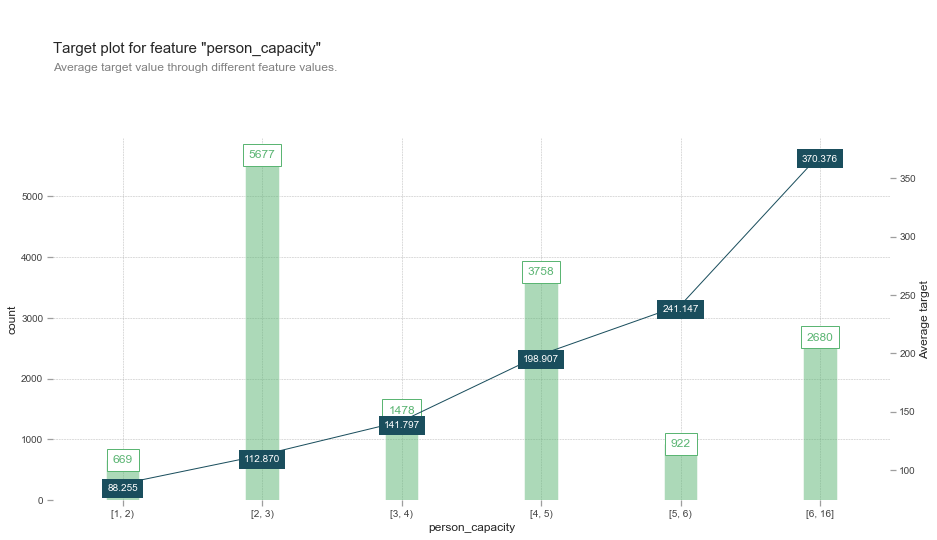

In [91]:
fig, axes, summary_df = info_plots.target_plot(
    df=X_pdp, feature='person_capacity', feature_name='person_capacity', target='target'
)

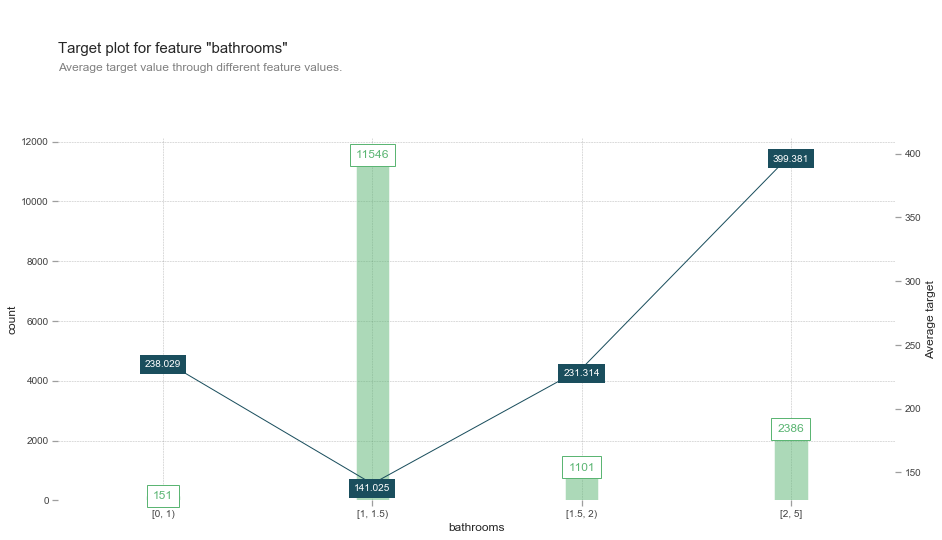

In [92]:
fig, axes, summary_df = info_plots.target_plot(
    df=X_pdp, feature='bathrooms', feature_name='bathrooms', target='target'
)

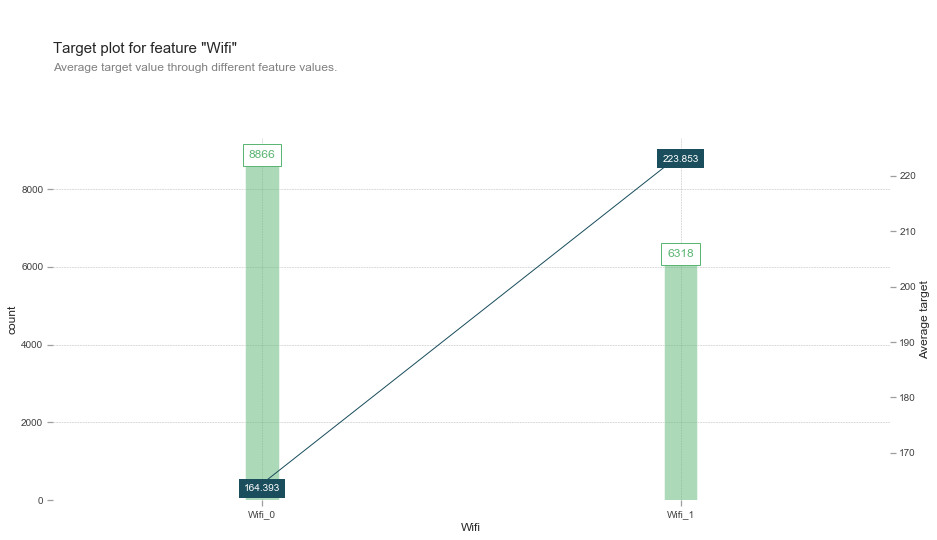

In [93]:
fig, axes, summary_df = info_plots.target_plot(
    df=X_pdp, feature='Wifi', feature_name='Wifi', target='target'
)

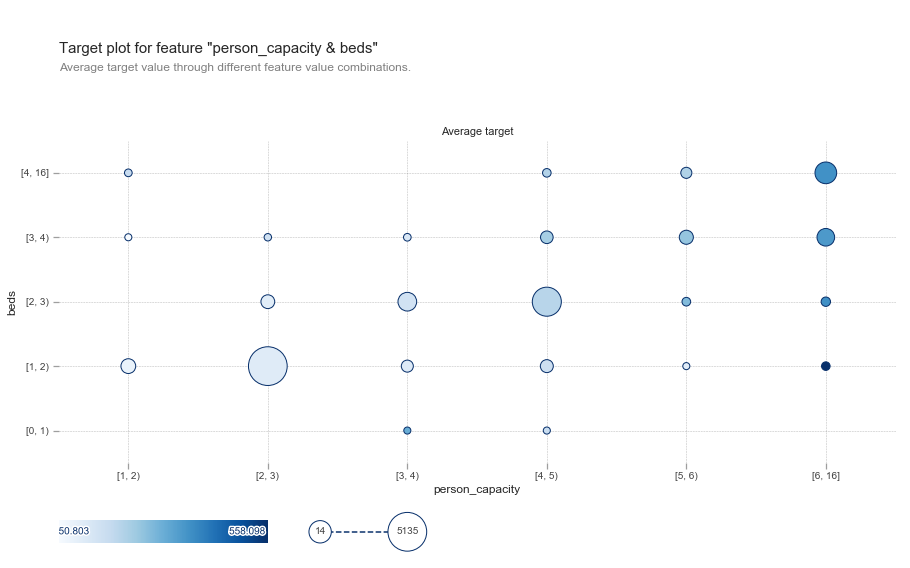

In [94]:
fig, axes, summary_df = info_plots.target_plot_interact(
    df=X_pdp, features=['person_capacity', 'beds'], 
    feature_names=['person_capacity', 'beds'], target='target'
)

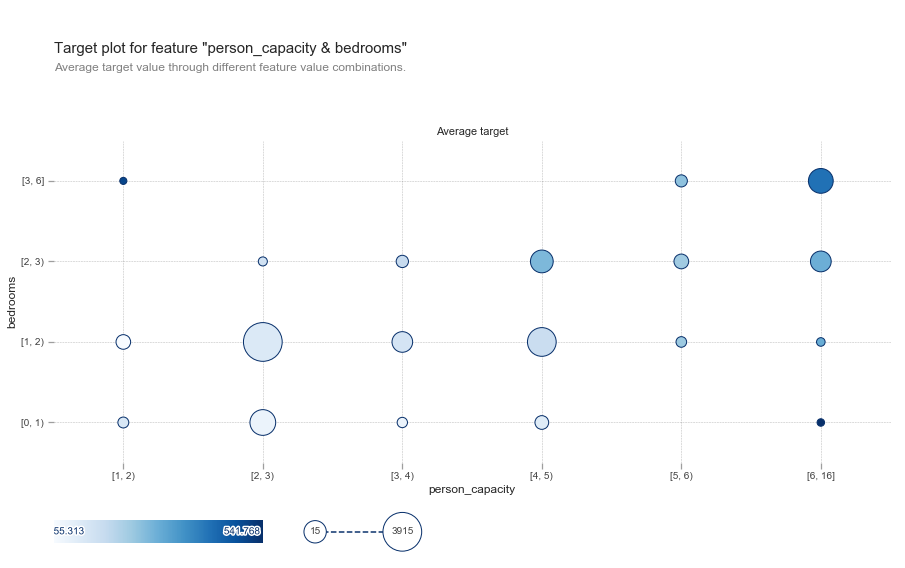

In [95]:
fig, axes, summary_df = info_plots.target_plot_interact(
    df=X_pdp, features=['person_capacity', 'bedrooms'], 
    feature_names=['person_capacity', 'bedrooms'], target='target'
)

In [96]:
explainer = shap.TreeExplainer(booster)
X_shap = X.iloc[sample_without_replacement(X.shape[0], int(X.shape[0] * 0.05)), :]
shap_values = explainer.shap_values(X_shap)

shap.initjs()

In [97]:
index = 2
shap.force_plot(explainer.expected_value, shap_values[index,:], X_shap.iloc[index,:])

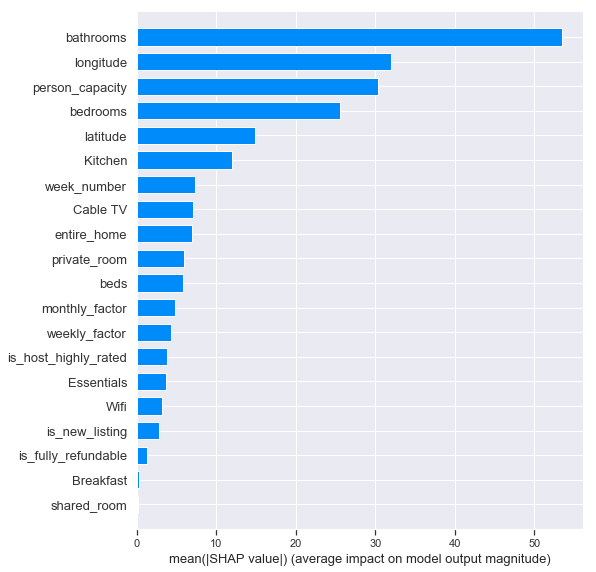

In [98]:
shap.summary_plot(shap_values, X_shap, plot_type="bar")

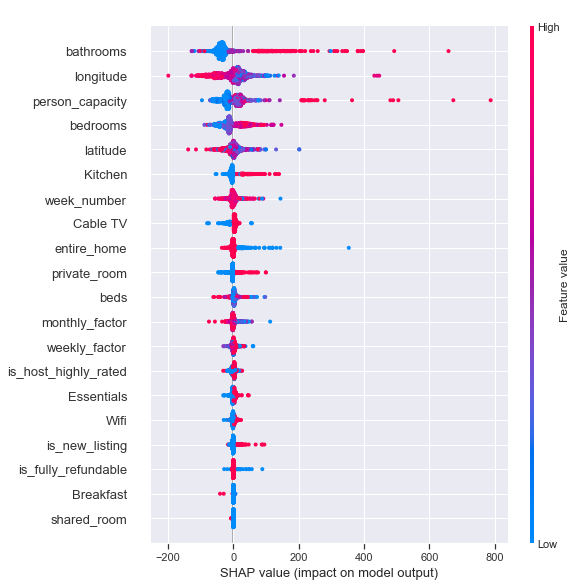

In [99]:
shap.summary_plot(shap_values, X_shap)

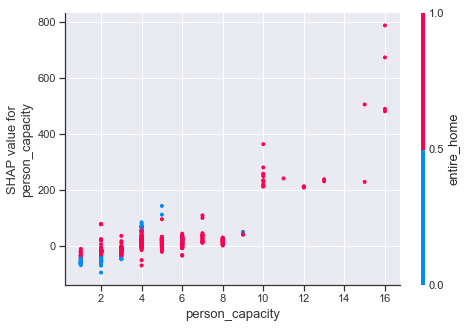

In [100]:
shap.dependence_plot("person_capacity", shap_values, X_shap)

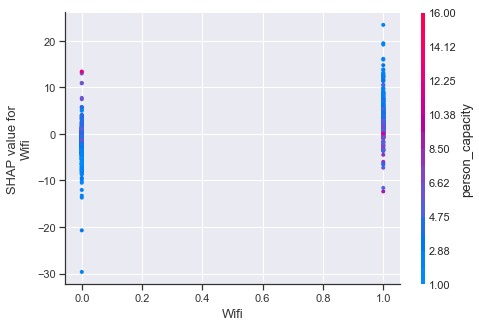

In [101]:
shap.dependence_plot("Wifi", shap_values, X_shap)